# 1.Data importing and preprocessing

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

In [5]:
df=pd.read_csv('./Loan_Default.csv')

In [6]:
df.head()

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,...,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,...,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,...,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,...,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 34 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ID                         148670 non-null  int64  
 1   year                       148670 non-null  int64  
 2   loan_limit                 145326 non-null  object 
 3   Gender                     148670 non-null  object 
 4   approv_in_adv              147762 non-null  object 
 5   loan_type                  148670 non-null  object 
 6   loan_purpose               148536 non-null  object 
 7   Credit_Worthiness          148670 non-null  object 
 8   open_credit                148670 non-null  object 
 9   business_or_commercial     148670 non-null  object 
 10  loan_amount                148670 non-null  int64  
 11  rate_of_interest           112231 non-null  float64
 12  Interest_rate_spread       112031 non-null  float64
 13  Upfront_charges            10

# In some features, there are a lot of NaN.

# 2.Visualization by AutViz

In [8]:
#pip install autoviz

Alert! from version 0.1.37. After importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
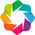

In [9]:
from autoviz.AutoViz_Class import AutoViz_Class

In [10]:
%matplotlib inline

In [11]:
AV = AutoViz_Class()

In [12]:
url1 = './Loan_Default.csv'
df_viz = pd.read_csv(url1,index_col=None,thousands=',')
print(df_viz.shape)
df_viz.head()

(148670, 34)


,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,...,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,...,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,...,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,...,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0


In [13]:
target='Status'

Shape of your Data Set loaded: (148670, 34)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    33 Predictors classified...
        2 variables removed since they were ID or low-information variables

################ Binary_Classification VISUALIZATION Started #####################


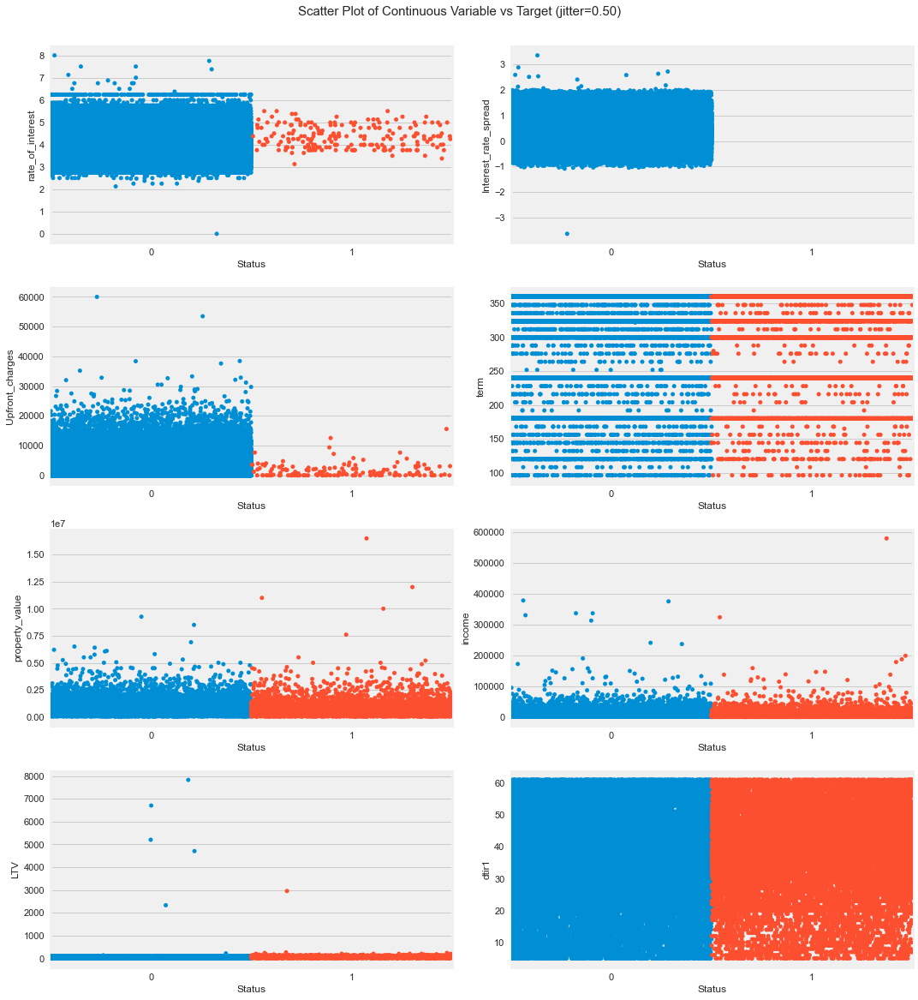

Total Number of Scatter Plots = 36


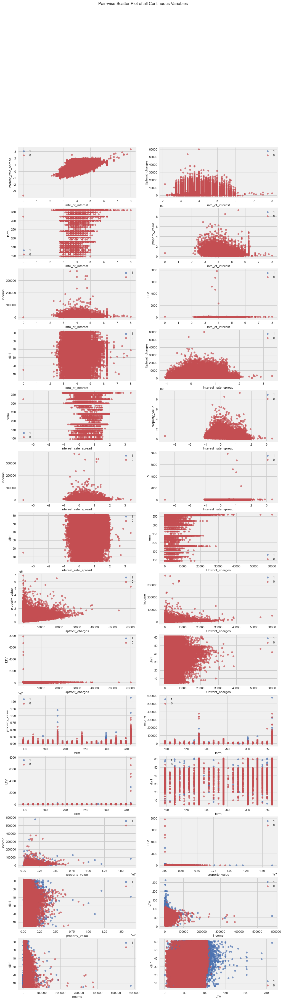

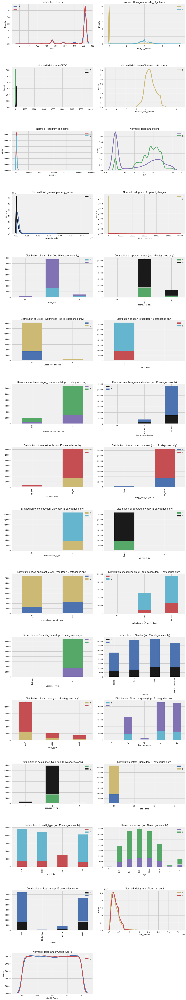

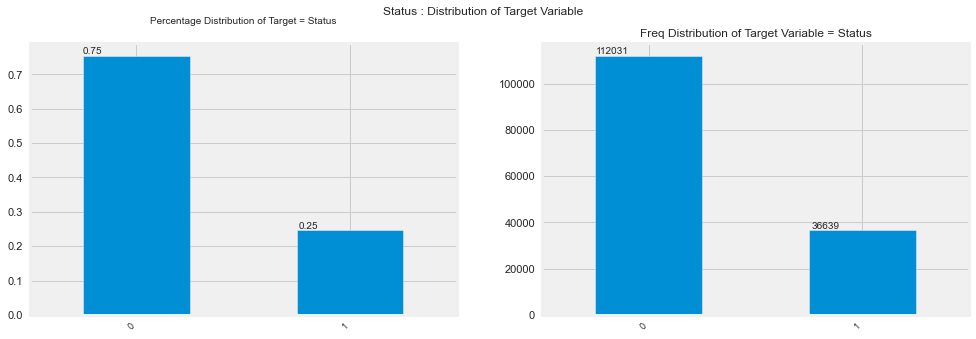

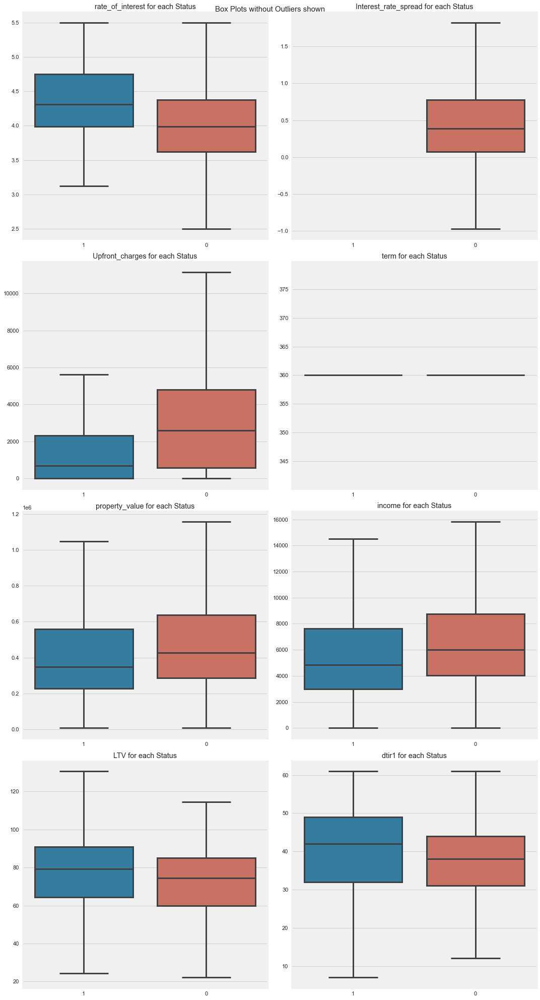

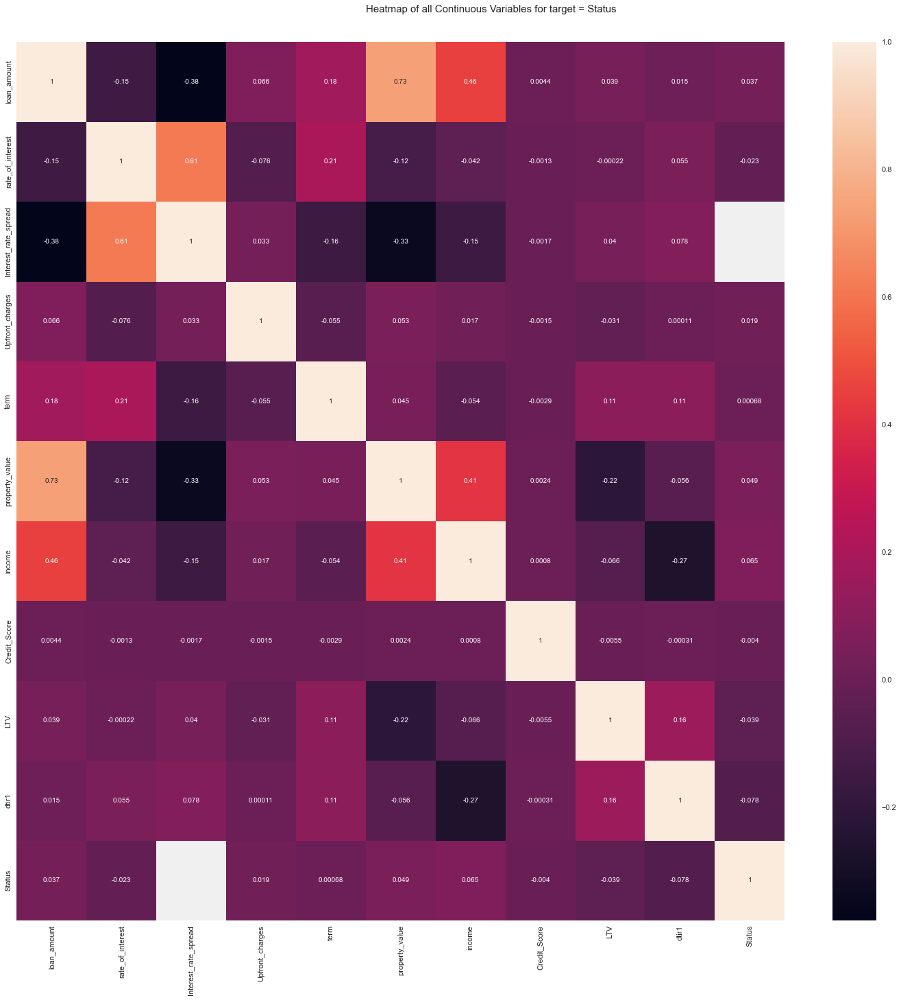

Could not draw Pivot Charts against Dependent Variable


<Figure size 1440x45900 with 0 Axes>

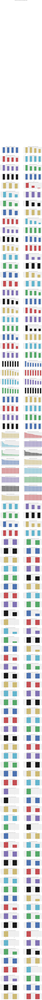

Time to run AutoViz = 80 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [14]:
dft = AV.AutoViz(depVar=target,dfte=df_viz, header=0, verbose=0,
                lowess=False,chart_format='svg',max_rows_analyzed=1500000,max_cols_analyzed=300,filename='', sep=',' )

# It seems that there are a lot of NaN in 'Status 1' in some features.

# 3.Comparing the model by PyCaret

First, I examined the features which seem to include a lot of NaN in 'Satus 1' and dropped them. They are
* 'rate_of_interest'
* 'Interest_rate_spread'
* 'Upfront_charges'
* 'income'
* 'property_value'
* 'LTV'
* 'dtir1'

In [15]:
df.groupby('Status')['rate_of_interest'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112031.0,4.044931,0.561356,0.000,3.625,3.9900,4.375,8.0
1,200.0,4.350500,0.495546,3.125,3.990,4.3125,4.750,5.5


In [16]:
df.groupby('Status')['Interest_rate_spread'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112031.0,0.441656,0.513043,-3.638,0.076,0.3904,0.7754,3.357
1,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
df.groupby('Status')['Upfront_charges'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,108875.0,3227.328554,3251.673989,0.0,584.39,2600.00,4815.315,60000.0
1,153.0,1565.237974,2299.820513,0.0,0.00,687.85,2310.750,15584.0


In [18]:
df.groupby('Status')['income'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,104120.0,7204.014214,6201.339600,0.0,4020.0,6000.0,8760.0,377220.0
1,35400.0,6231.806780,7247.649876,0.0,3000.0,4860.0,7620.0,578580.0


In [19]:
df.groupby('Status')['property_value'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112029.0,505606.066286,342784.462653,8000.0,288000.0,428000.0,638000.0,9268000.0
1,21543.0,457786.009377,436255.032008,8000.0,228000.0,348000.0,558000.0,16508000.0


In [20]:
df.groupby('Status')['LTV'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112029.0,72.064757,41.768899,2.072943,59.970817,74.504405,85.201149,7831.25
1,21543.0,76.291468,28.580217,0.967478,64.273172,79.362416,90.948276,2956.25


In [21]:
df.groupby('Status')['dtir1'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,104220.0,37.369267,10.027197,5.0,31.0,38.0,44.0,61.0
1,20329.0,39.597324,12.716828,5.0,32.0,42.0,49.0,61.0


In [22]:
df1=df.drop(['rate_of_interest',
'Interest_rate_spread',
'Upfront_charges',
'income',
'property_value',
'LTV',
'dtir1'],axis=1)

In [23]:
#pip install pycaret --ignore-installed llvmlite numba

In [24]:
from pycaret.classification import *

In [30]:
exp_clf = setup(df1, 
                target = 'Status',
                silent=True,
                session_id=1,
                fold_shuffle=True,
                imputation_type = 'iterative',
               )

,Description,Value
0,session_id,1
1,Target,Status
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(148670, 27)"
5,Missing Values,1
6,Numeric Features,4
7,Categorical Features,22
8,Ordinal Features,0
9,High Cardinality Features,0


AttributeError: 'Make_Time_Features' object has no attribute 'list_of_features'

In [31]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8671,0.8361,0.4847,0.9553,0.6431,0.5719,0.6216,3.7230
lightgbm,Light Gradient Boosting Machine,0.8670,0.8428,0.4887,0.9475,0.6448,0.5730,0.6206,0.6960
ada,Ada Boost Classifier,0.8643,0.8278,0.4807,0.9415,0.6364,0.5635,0.6116,1.3050
lda,Linear Discriminant Analysis,0.8614,0.8252,0.4508,0.9747,0.6165,0.5454,0.6060,0.2860
ridge,Ridge Classifier,0.8603,0.0000,0.4429,0.9818,0.6103,0.5396,0.6033,0.0750
qda,Quadratic Discriminant Analysis,0.8594,0.8176,0.4650,0.9319,0.6203,0.5456,0.5954,0.2450
rf,Random Forest Classifier,0.8546,0.8113,0.5055,0.8434,0.6321,0.5485,0.5764,2.3140
et,Extra Trees Classifier,0.8335,0.7973,0.5319,0.7212,0.6122,0.5093,0.5189,3.1320
dt,Decision Tree Classifier,0.7825,0.7192,0.5941,0.5560,0.5744,0.4285,0.4290,0.2540
lr,Logistic Regression,0.7718,0.5728,0.0883,0.1766,0.1177,0.1015,0.1107,0.7760


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=1, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [32]:
lg=create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8666,0.8359,0.4874,0.9471,0.6436,0.5716,0.6194
1,0.8711,0.8466,0.5049,0.9502,0.6594,0.5889,0.6337
2,0.8661,0.8404,0.4893,0.9402,0.6436,0.5711,0.6173
3,0.8683,0.8468,0.4899,0.9553,0.6476,0.5767,0.6254
4,0.8675,0.8438,0.4899,0.9495,0.6463,0.5748,0.6225
5,0.8679,0.8467,0.4911,0.9503,0.6475,0.5762,0.6238
6,0.8645,0.8391,0.4755,0.9525,0.6343,0.5623,0.6135
7,0.8633,0.8393,0.4771,0.9402,0.6330,0.5597,0.6084
8,0.8660,0.8421,0.4850,0.9468,0.6415,0.5694,0.6176
9,0.8684,0.8473,0.4975,0.9432,0.6514,0.5797,0.6248


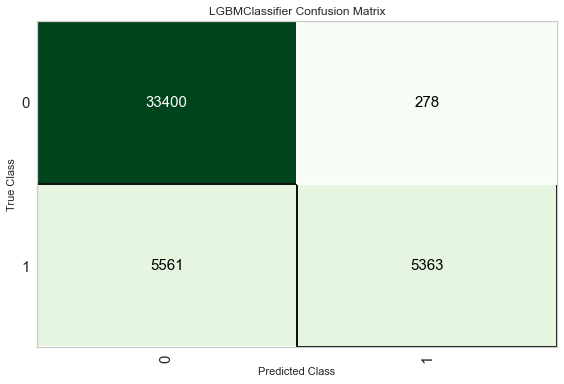

In [33]:
plot_model(lg, plot = 'confusion_matrix') 

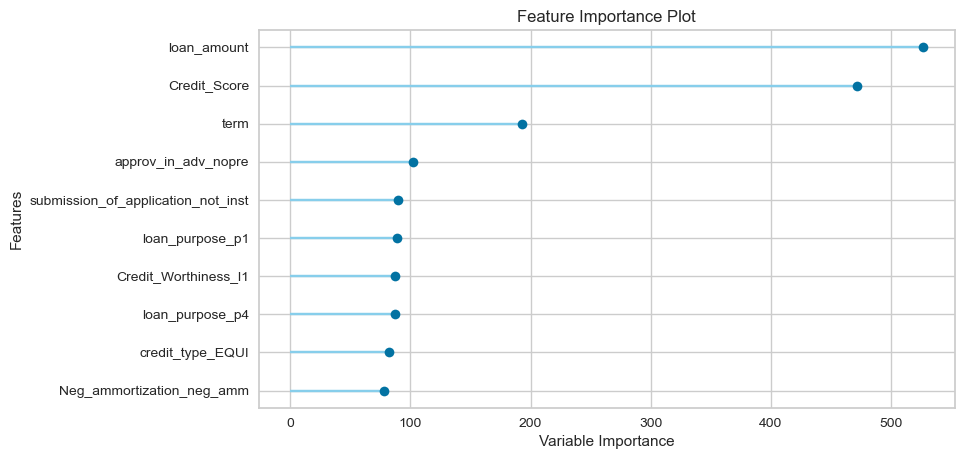

In [34]:
plot_model(lg, plot='feature')

In [35]:
interpret_model(lg, plot='reason',observation=32)

# In this model, how we can find people who may default, 'Status 0',is very important. So this model may be useful although we may miss non default custmers as default....